In [2]:
import sys
sys.path.append("../src")

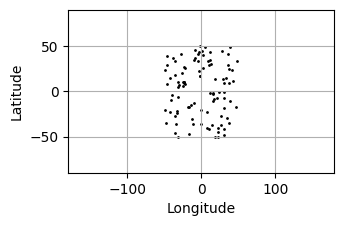

Mean: 2.350915083999663 | Median: 2.2956889303033856 | Max: 4.453092804115265 | Min: 1.0353597651039605


In [3]:
from core.simulator import Simulator
from core.gossip_algorithm import SpatialGossipWithCobraWalk
from core.network import Network
import numpy as np

network = Network.randomize(num_nodes = 100, grid_size=100)
network.show_network()
spatial_sim = Simulator(network=network, gossip_algorithm=SpatialGossipWithCobraWalk(network=network, dimension=2, rho = 1.1, cobra_walk_rho=0.8))
spatial_sim.setup()
stretch, _ = spatial_sim.run()
print(stretch)


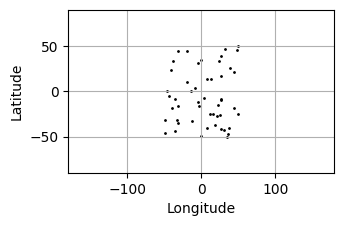

1 of 10
[[np.float64(2.5858690032640474), np.float64(3.2052512772361106), np.float64(3.6519107358830483), np.float64(2.620613748694611), np.float64(2.2353538030742026), np.float64(2.874116758108448), np.float64(2.2193194539841907), np.float64(3.248243338746297), np.float64(2.172816551166747), np.float64(2.8294515455761564), np.float64(3.3970837955467057), np.float64(2.65634076253214), np.float64(2.4162174962647605), np.float64(2.421030571606885), np.float64(2.6922365214582076), np.float64(1.8636376509450363), np.float64(6.226105053970073), np.float64(1.7752422782225605), np.float64(2.581151712913384), np.float64(3.2330675290824753), np.float64(2.6649711004625787), np.float64(2.183374326592187), np.float64(2.0659681041736437), np.float64(2.67709786126329), np.float64(1.9096580671871828), np.float64(1.9439351685117932), np.float64(1.663365028658886), np.float64(2.1902485568824654), np.float64(2.0790570564035424), np.float64(1.9783891433815723), np.float64(2.498338491476243), np.float64(2

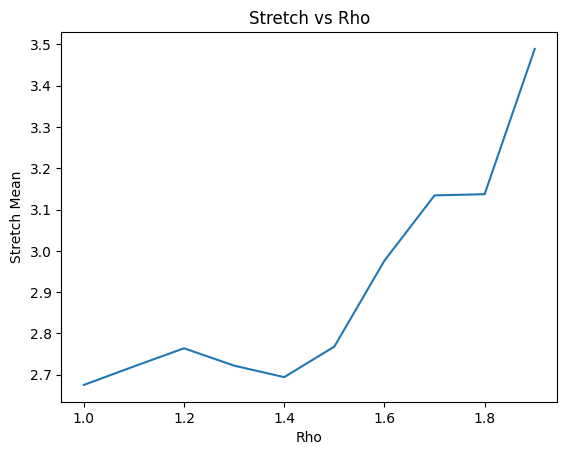

Rho 	 Mean 			 Median 		 Variance 		 Max 			 Min
1.0 	 2.6750211020009127 	 2.487729679984594 	 0.5375532045534582 	 6.226105053970073 	 1.663365028658886
1.1 	 2.7198361539861478 	 2.536134609677947 	 0.9088195044269 	 7.769834775735417 	 1.6150454743475124
1.2 	 2.7638029598621214 	 2.4490261080795914 	 1.0679646452765659 	 6.827645033196704 	 1.7107333388442814
1.3 	 2.7217461097395543 	 2.473540269673502 	 0.6921813550713519 	 5.840318784063315 	 1.7101314319098149
1.4 	 2.6938924862817375 	 2.5743852696735363 	 0.5659705339016083 	 6.148360887011419 	 1.0715312597511286
1.5 	 2.7678795653807016 	 2.591617711786758 	 0.4478500016808524 	 5.589332597204802 	 1.1902450153225523
1.6 	 2.9761801741360743 	 2.892240852152776 	 0.907022493187607 	 6.284522555083918 	 1.021973564847884
1.7 	 3.1342953015805093 	 2.860553577360503 	 1.0577613015543272 	 7.203163665067174 	 1.0062066507566423
1.8 	 3.13721765963951 	 3.103874367327694 	 1.1755774122013383 	 6.1997558946418465 	 1.0000649653

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from core.simulator import Simulator
from core.network import Network
from utils.basic_types import Node
from utils.position import Euclidean2D

network = Network.randomize(num_nodes = 50, grid_size=100)
network.show_network()
spatial_results = []
for i, rho in enumerate(np.arange(1, 2, 0.1)):
    print(f"{i+1} of {len(np.arange(1, 2, 0.1))}")
    runs_results = []
    for run in range(100):
        spatial_sim = Simulator(network=network, gossip_algorithm=SpatialGossipWithCobraWalk(network=network, dimension=2, rho = rho, cobra_walk_rho=0.8))
        spatial_sim.setup()
        runs_results.append(spatial_sim.run()[0])
    spatial_results.append([run.mean() for run in runs_results for run in runs_results])

plt.plot(np.arange(1, 2, 0.1), [np.mean(x) for x in spatial_results])
plt.xlabel("Rho")
plt.ylabel("Stretch Mean")
plt.title("Stretch vs Rho")
plt.show()

#print table with mean, median, variance, max, min for each rho
print("Rho \t Mean \t\t\t Median \t\t Variance \t\t Max \t\t\t Min")
for i in range(len(spatial_results)):
    print(f"{(1*10+i)/10} \t {np.mean(spatial_results[i])} \t {np.median(spatial_results[i])} \t {np.var(spatial_results[i])} \t {np.max(spatial_results[i])} \t {np.min(spatial_results[i])}")